In [2]:
from IPython.display import Image
import matplotlib.pyplot as plt

# [Albumentations](https://github.com/albumentations-team/albumentations#pixel-level-transforms)

In [2]:
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2

# Трансформации c изменением положения

# [Affine](https://explore.albumentations.ai/transform/Affine)

Изменяет изображение с помощью операций, которые можно выразить через матрицу преобразования.

Включает в себя: 
    
- **Translation** (сдвиг) – перемещение изображения по горизонтали или вертикали. $\newline$

- **Rotation** (поворот) – вращение изображения на заданный угол (в градусах). $\newline$
 
- **Scaling** (масштабирование) – увеличение или уменьшение изображения. $\newline$

- **Shear** (сдвиг по углу) – наклон изображения, при котором прямоугольник превращается в параллелограмм или даже в трапецию.

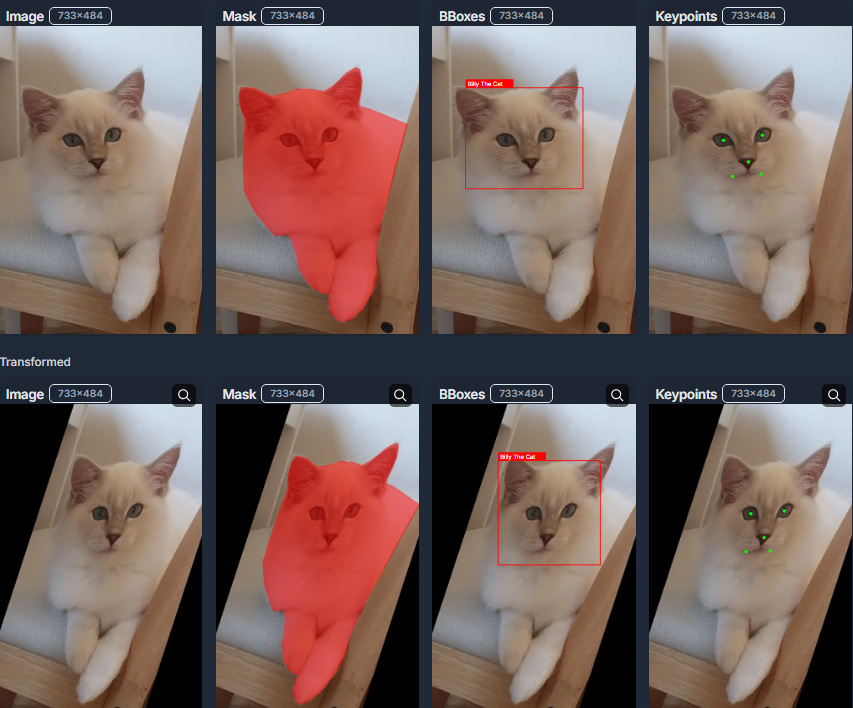

In [125]:
Image("datasets/images/Affine.png", width="60%")

**class [Affine](https://albumentations.ai/docs/api_reference/augmentations/geometric/transforms/#:~:text=class%20Affine) (scale = (1.0, 1.0), translate_percent = None, translate_px = None, rotate = 0.0, shear = (0.0, 0.0), interpolation = 1, mask_interpolation = 0, fit_output = False, keep_ratio = False, rotate_method = 'largest_box', balanced_scale = False, border_mode = 0, fill = 0, fill_mask = 0, p = 0.5)**

**scale** - задает коэффициент масштабирования изображения. Можно передать число или диапазон в виде кортежа из которого равномерно будут браться коэффициенты для каждого изображения. Например, коэффициент $0.5$ уменьшит изображение до половины от исходного. Если **keep_ratio** = **True**, то масштаб по $x$ и $y$ выбирается одинаковым, сохраняя соотношение сторон.

**keep_ratio** - если **True**, исходное соотношение сторон будет сохранено при применении случайного масштаба.

**translate_percent** и **translate_px** - задают сдвиг изображения по осям. 

- Для **translate_percent** указывается в виде доли от размеров изображения. Например, значение $0.1$ означает сдвиг на $10\%$ ширины или высоты. Можно задать одно число, диапазон (кортеж) или словарь с разными значениями для $x$ и $y:$ **translate_percent = {"x": (a, b), "y": (c, d)}**. $\newline$ 

- **translate_px** задает сдвиг в пикселях. Если не указан, используется **translate_percent**, если он тоже не задан – по умолчанию сдвиг равен 0.

**rotate** - поворот изображения. Указывается угол поворота в градусах. Вращение происходит вокруг центра изображения, а не верхнего левого угла. Можно задать одно число или диапазон (кортеж).

**shear** - определяет наклон (сдвиг) изображения. Значения указываются в градусах в диапазоне $[-360, 360]$ (разумные значения находятся в диапазоне от $-45$ до $45$ градусов). Можно задать одно число – оно будет применяться как сдвиг по оси $x$, или диапазон/словарь, чтобы задать сдвиги по обеим осям. Это можно представить, как операцию над листом бумаги, в котором нижнюю часть бумаги зафиксировали, а верхнюю часть сдвигают, например, вправо. В результате нижняя часть остаётся на месте, а верхняя смещается, и бумага становится наклонной. При этом прямые линии сохраняются прямыми, но угол между сторонами меняется – прямоугольник превращается в параллелограмм. Формально, если точка на листе имеет координаты $(x,y)$, то **shear** по оси $X$ может менять координаты так: $(x,y)→(x+k\cdot y,y)$.

**interpolation** и **mask_interpolation** - определяют, каким методом интерполировать (вычислять) новые пиксели, когда происходит преобразование. При выполнении геометрических преобразований, таких как поворот, новые координаты пикселей могут оказаться не на узлах этой сетки, а между ними (например, $[10.3, 20.7]$). Чтобы вычислить значение в позиции (например, $[10.3, 20.7]$), алгоритм использует методы интерполяции. 

**fill** и **fill_mask** - цвет (значение) для заполнения пустых областей, которые появляются, когда часть изображения оказывается вне исходной области после преобразования. Диапазон ожидаемых значений — $[0, 255]$ для uint8 изображений. **fill_mask** - то же самое, но для масок. Используется только при **border_mode = cv2.BORDER_CONSTANT**.

**border_mode** - определяет, как обрабатываются пиксели за границами исходного изображения после аффинных преобразований. 

- **cv2.BORDER_CONSTANT** - заполняет края фиксированным цветом (например, черным) $\newline$ 

- **cv2.BORDER_REPLICATE** - повторяет последний пиксель исходного изображения. $\newline$ 

- **cv2.BORDER_REFLECT** - зеркально отражает изображение относительно края. $\newline$ 

- **cv2.BORDER_WRAP** - "заворачивает" пиксели по принципу текстуры, которая повторяется бесконечно во всех направлениях. Работает так, как бы дублируя и стыкуя преобразованное изображение вокруг этого преобразованного изображения.

**balanced_scale** - обеспечивает, чтобы выбор масштаба был сбалансирован – равное количество случаев, когда изображение уменьшается и когда увеличивается. Например, если просто выбирать случайное значение из диапазона (например, $[0.5, 2]$), то, из-за несимметричности диапазона, скорее всего чаще получится увеличение (масштаб > 1). **balanced_scale = True** корректирует это.

**fit_output** - если **True**, то сохранит всю область преобразования, расширяя размер изображения, чтобы ничего не обрезалось.

**p** - вероятность применения трансформации.

# [AtLeastOneBBoxRandomCrop](https://explore.albumentations.ai/transform/AtLeastOneBBoxRandomCrop)

Выполняет обрезку изображения, гарантируя наличие хотя бы одной ограничивающей рамки (bounding box) в обрезанной области. Это полезно в задачах детекции объектов, где важно сохранить репрезентативность данных, но допустима потеря части объектов для увеличения разнообразия.

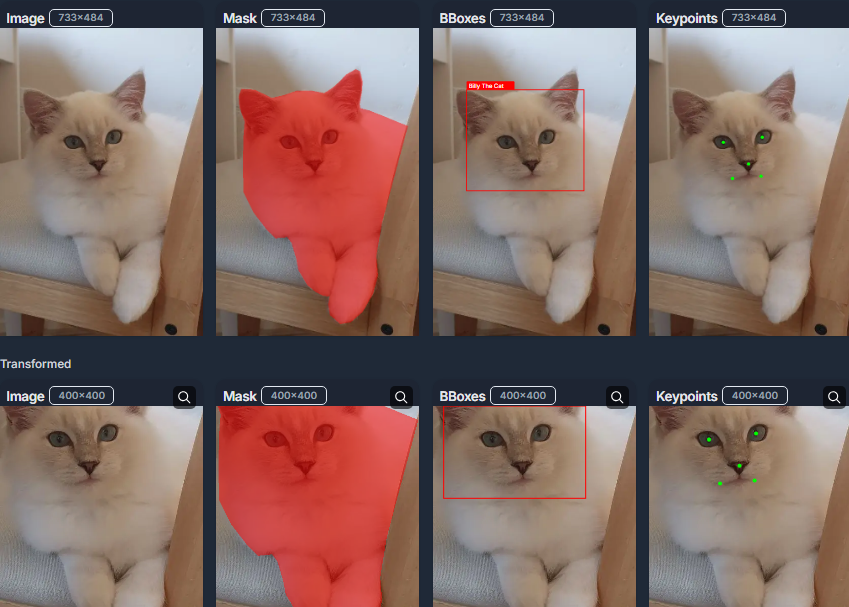

In [128]:
Image("datasets/images/AtLeastOneBBoxRandomCrop.png", width="60%")

**class [AtLeastOneBBoxRandomCrop](https://albumentations.ai/docs/api_reference/augmentations/crops/transforms/#:~:text=class%20AtLeastOneBBoxRandomCrop) (height, width, erosion_factor = 0.0, p = 1.0)**

**height** - фиксированная высота обрезанной части.

**width** - фиксированная ширина обрезанной части.

**erosion_factor** - отвечает за то, насколько нужно «уменьшить» (эрозировать) исходный ограничивающий прямоугольник (bounding box) при вычислении допустимых регионов обрезки. Для этого случайным образом выбирается опорный ограничивающий прямоугольник (bounding box) из всех доступных ограничивающих прямоугольников. Если **erosion_factor** = 0, то область вырезки должна полностью содержать исходный bounding box – никаких изменений не происходит. Если **erosion_factor** = 1, то область обрезки может располагаться практически произвольно, достаточно чтобы хоть какая-то часть bounding box пересекалась с обрезанной частью. При значениях между 0 и 1 область вырезки выбирается так, чтобы уменьшенная (эрозированная) область оказалась внутри обрезанной части. Например, процесс эрозирования может происходить так:

    x_center = (x_min + x_max) / 2
    y_center = (y_min + y_max) / 2
    width = (x_max - x_min) * (1 - erosion_factor)
    height = (y_max - y_min) * (1 - erosion_factor)
    new_x_min = x_center - width / 2
    new_y_min = y_center - height / 2
 
**p** - вероятность применения трансформации.

# [BBoxSafeRandomCrop](https://explore.albumentations.ai/transform/BBoxSafeRandomCrop)

Выполняет обрезку изображения, гарантируя наличие всех ограничивающих рамок в обрезанной области. Это полезно в задачах детекции объектов, где необходимо сохранить все ограничивающие рамки, потеря любой ограничивающей рамки может быть критичной или когда обучается модель, которая должна обнаруживать несколько объектов одновременно.

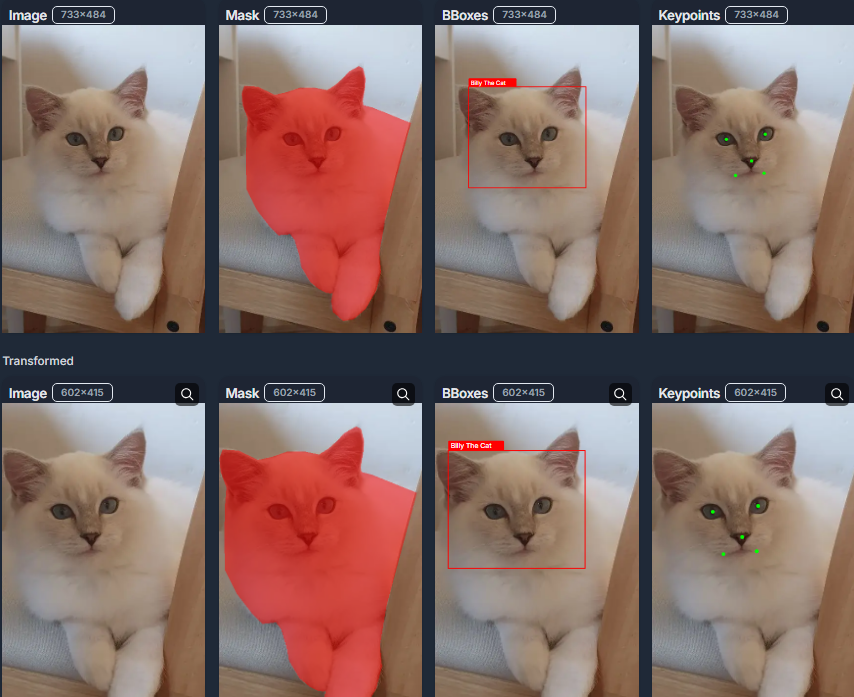

In [130]:
Image("datasets/images/BBoxSafeRandomCrop.png", width="60%")

**class [BBoxSafeRandomCrop](https://albumentations.ai/docs/api_reference/augmentations/crops/transforms/#:~:text=class%20BBoxSafeRandomCrop) (erosion_rate = 0.0, p = 1.0)**

**erosion_rate** - работает так же, как в **AtLeastOneBBoxRandomCrop**, только вместо случайного выбора опорного ограничивающего прямоугольника выбирается область, которая объединяет все ограничивающие прямоугольники.

**p** - вероятность применения трансформации.

# [RandomCrop](https://explore.albumentations.ai/transform/RandomCrop)

Обрезать случайную часть входных данных.

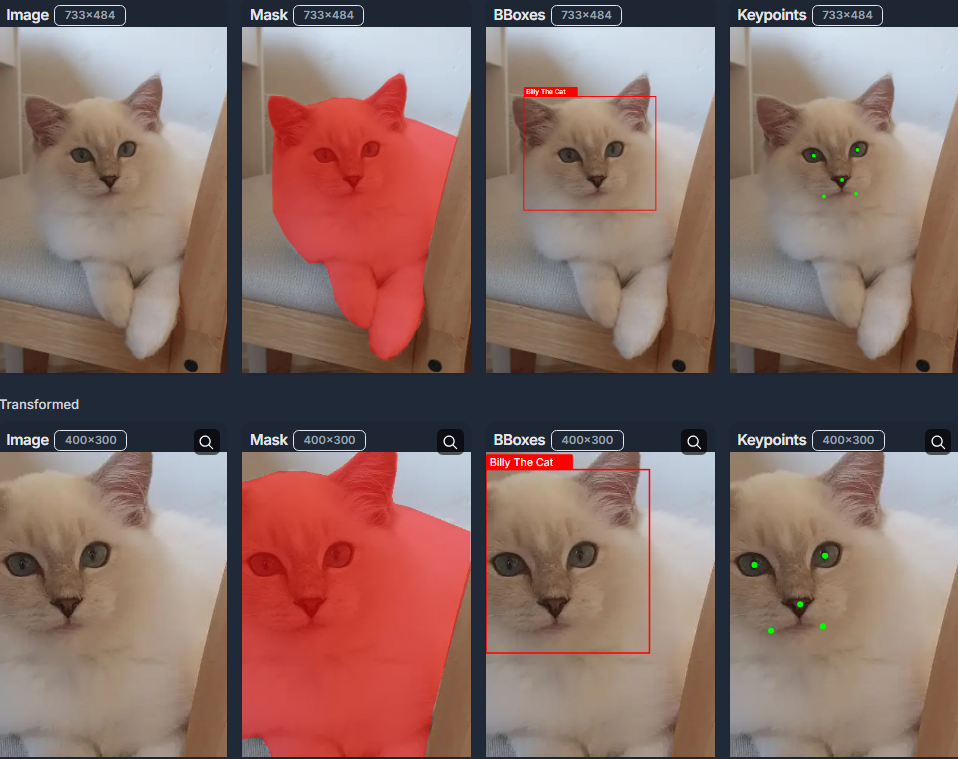

In [13]:
Image("datasets/images/RandomCrop.png", width="60%")

**class [RandomCrop](https://albumentations.ai/docs/api_reference/augmentations/crops/transforms/#:~:text=class%20RandomCrop) (height, width, pad_if_needed = False, pad_position = 'center', border_mode = 0, fill = 0.0, fill_mask = 0.0, p = 1.0)**

**height** - фиксированная высота обрезанной части.

**width** - фиксированная ширина обрезанной части.

**pad_if_needed** - нужно ли добавлять отступ, если размер обрезки превышает размер изображения. Если размер обрезки превышает размер изображения, a **pad_if_needed = False**, то вызовется исключение. 

**border_mode** - определяет, как обрабатываются пиксели за границами исходного изображения, если размер обрезки превышает размер изображения. 

- **cv2.BORDER_CONSTANT** - заполняет края фиксированным цветом (например, черным) $\newline$ 

- **cv2.BORDER_REPLICATE** - повторяет последний пиксель исходного изображения. $\newline$ 

- **cv2.BORDER_REFLECT** - зеркально отражает изображение относительно края. $\newline$ 

- **cv2.BORDER_WRAP** - "заворачивает" пиксели по принципу текстуры, которая повторяется бесконечно во всех направлениях. Работает так, как бы дублируя и стыкуя обрезанное изображение вокруг обрезанного изображения.

**fill** и **fill_mask** - цвет (значение) для заполнения пустых областей, которые появляются, когда часть изображения оказывается вне исходной области после обрезания. Диапазон ожидаемых значений — $[0, 255]$ для uint8 изображений. **fill_mask** - то же самое, но для масок. Используется только при **border_mode = cv2.BORDER_CONSTANT**.

**pad_position** - положение, где будет обрезанное изображение, если размер обрезки превышает размер исходного изображения. Возможные значения: **center**, **top_left**, **top_right**, **bottom_left**, **bottom_right** и **random**.

**p** - вероятность применения трансформации.

# [RandomResizedCrop](https://explore.albumentations.ai/transform/RandomResizedCrop)

Обрезает случайную часть входного изображения, а затем изменяет размер обрезки до указанного размера.

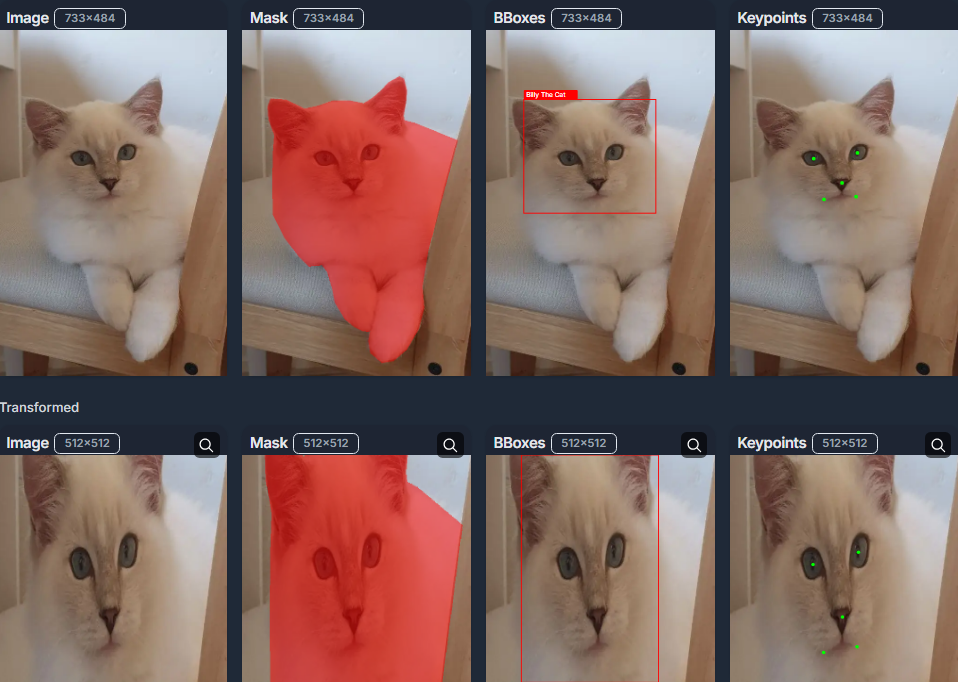

In [14]:
Image("datasets/images/RandomResizedCrop.png", width="60%")

**class [RandomResizedCrop](https://albumentations.ai/docs/api_reference/augmentations/crops/transforms/#:~:text=class%20RandomResizedCrop) (size, scale=(0.08, 1.0), ratio=(0.75, 1.3333), interpolation=1, mask_interpolation=0, p=1.0)** 

**size** - размер выходного изображения. Значение: **(высота, ширина)** в виде кортежа. 

**scale** - диапазон случайного размера обрезки относительно входного размера. Например, (0.08, 1.0) означает, что размер обрезки будет между 8% и 100% входного размера.

**ratio** - диапазон соотношения сторон обрезанного изображения. Например, (0.75, 1.3333) допускает соотношения сторон от 3:4 до 4:3.

**p** - вероятность применения трансформации.

# [CoarseDropout](https://explore.albumentations.ai/transform/CoarseDropout)

Случайным образом удаляет прямоугольные области из изображения, чтобы имитировать различные размеры объектов, которые могут перекрывать нужные объекты на изображении в реальных условиях.

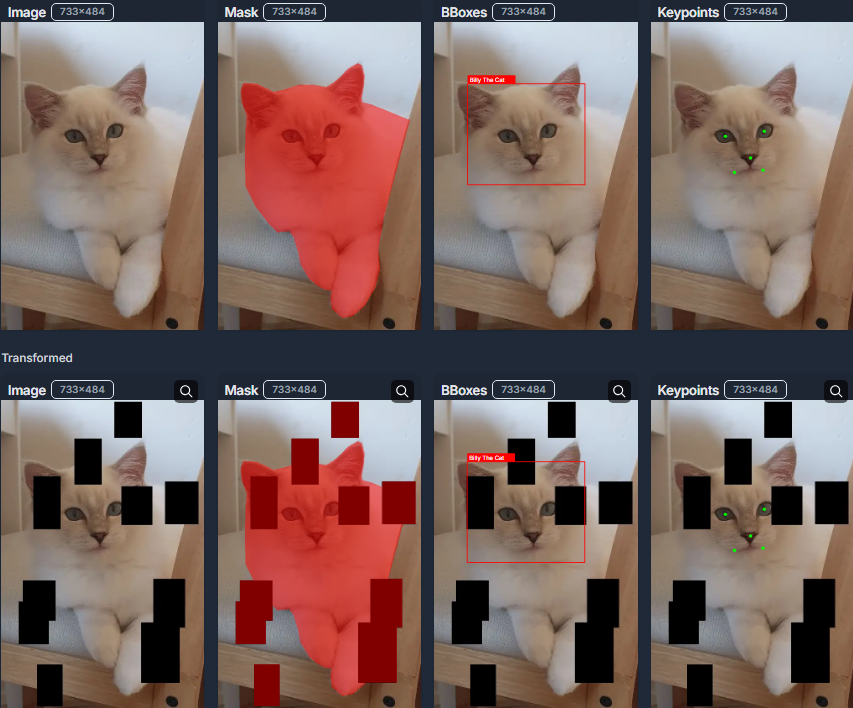

In [8]:
Image("datasets/images/CoarseDropout.png", width="60%")

**class [CoarseDropout](https://albumentations.ai/docs/api_reference/augmentations/dropout/coarse_dropout/#:~:text=class%20CoarseDropout) (num_holes_range = (1, 2), hole_height_range = (0.1, 0.2), hole_width_range = (0.1, 0.2), fill = 0, fill_mask = None, p = 0.5)**

**num_holes_range** - диапазон для количества прямоугольных областей в виде кортежа.

**hole_height_range** - диапазон для высоты прямоугольных областей в виде кортежа. Если **int**, указывает абсолютные значения пикселей. Если **float**, интерпретируется как доля высоты изображения.

**hole_width_range** - диапазон для ширины прямоугольных областей в виде кортежа. Если **int**, указывает абсолютные значения пикселей. Если **float**, интерпретируется как доля ширины изображения.

**fill** - задаёт, каким образом заполняются значения замаскированных пикселей.

- **int** или **float** - все пиксели в области маскирования заполняются этим значением во всех каналах.

- **tuple** - для каждого канала используется соответствующее значение из кортежа.

- **random** - каждый пиксель в области маскирования заполняется случайными значениями, причём для каждого пикселя значения генерируются независимо.

- **random_uniform** - для каждой маскированной области генерируется один случайный цвет и вся область заполняется именно этим единым случайным цветом.

- **inpaint_telea** и **inpaint_ns** -  используется алгоритм inpainting OpenCV. Вместо простого заполнения, замаскированные области заполняются, основываясь на информации из окружающих пикселей с использованием данного алгоритма восстановления.

**fill_mask** - задаёт, каким образом заполняются значения замаскированных пикселей для масок. 

**p** - вероятность применения трансформации.

# [ConstrainedCoarseDropout](https://explore.albumentations.ai/transform/ConstrainedCoarseDropout)

«Выбрасывает» (dropout) части изображения, создавая так называемые «дыры» именно в тех объектах, которые нам интересны (маски, ограничивающие прямоугольники).

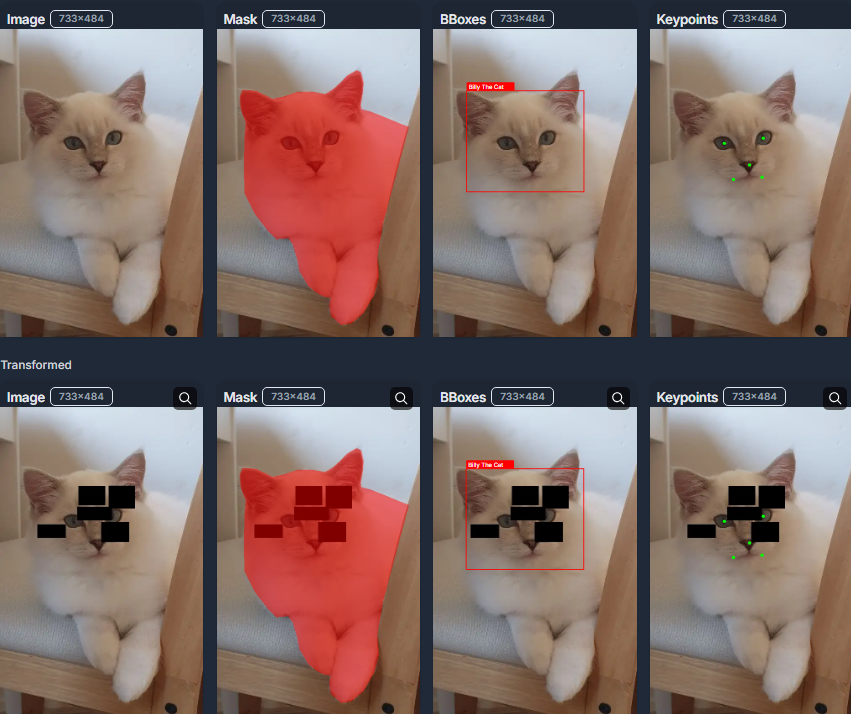

In [9]:
Image("datasets/images/ConstrainedCoarseDropout.png", width="60%")

**class [ConstrainedCoarseDropout](https://albumentations.ai/docs/api_reference/augmentations/dropout/coarse_dropout/#:~:text=class%20ConstrainedCoarseDropout) (num_holes_range = (1, 1), hole_height_range = (0.1, 0.1), hole_width_range = (0.1, 0.1), fill = 0, fill_mask = None, p = 0.5, mask_indices = None, bbox_labels = None)**

**num_holes_range** - диапазон количества дыр в виде кортежа, которые будут созданы для каждого целевого объекта. Например, если указано $(2, 4)$, то для каждого объекта будет выбрано случайное число **N** в диапазоне от 2 до 4, и затем для каждого объекта создадутся ровно **N** дыр. 

**hole_height_range** - диапазон для высоты каждой дыры, заданный в виде доли от размера объекта. Например, $(0.2, 0.4)$ означает, что высота каждой дыры будет от $20\%$ до $40\%$ от высоты бокса. Для объектов, заданных маской, высота дыры вычисляется как доля от квадратного корня площади компоненты маски. 

**hole_width_range** - диапазон для ширины каждой дыры, заданный в виде доли от размера объекта. Например, $(0.2, 0.4)$ означает, что высота каждой дыры будет от $20\%$ до $40\%$ от ширины бокса. Для объектов, заданных маской, ширина дыры вычисляется как доля от квадратного корня площади компоненты маски. 

**fill** - задаёт, каким образом заполняются значения замаскированных пикселей.

- **int** или **float** - все пиксели в области маскирования заполняются этим значением во всех каналах.

- **tuple** - для каждого канала используется соответствующее значение из кортежа.

- **random** - каждый пиксель в области маскирования заполняется случайными значениями, причём для каждого пикселя значения генерируются независимо.

- **random_uniform** - для каждой маскированной области генерируется один случайный цвет и вся область заполняется именно этим единым случайным цветом.

- **inpaint_telea** и **inpaint_ns** -  используется алгоритм inpainting OpenCV. Вместо простого заполнения, замаскированные области заполняются, основываясь на информации из окружающих пикселей с использованием данного алгоритма восстановления.

**fill_mask** - задаёт, каким образом заполняются значения замаскированных пикселей для масок. 

**mask_indices** - cписок индексов ( $\text{List[int]}$ ) классов, по которым выбираются целевые объекты в сегментационной маске. Только объекты, имеющие один из этих индексов, будут подвергнуты dropout'у.

**bbox_labels** - cписок меток ( $\text{List[str | int | float]}$ ) классов, по которым выбираются целевые объекты среди ограничивающих прямоугольников. Только объекты, имеющие один из этих меток, будут подвергнуты dropout'у.

**p** - вероятность применения трансформации.

# [XYMasking](https://explore.albumentations.ai/transform/XYMasking)

Применяет маскирующие полосы к изображению, как по горизонтали (ось X), так и по вертикали (ось Y). Это преобразование полезно для обучения моделей распознаванию изображений с различными условиями видимости. Оно особенно эффективно для изображений спектрограмм, позволяя использовать спектральную и частотную маскировку для повышения надежности модели.

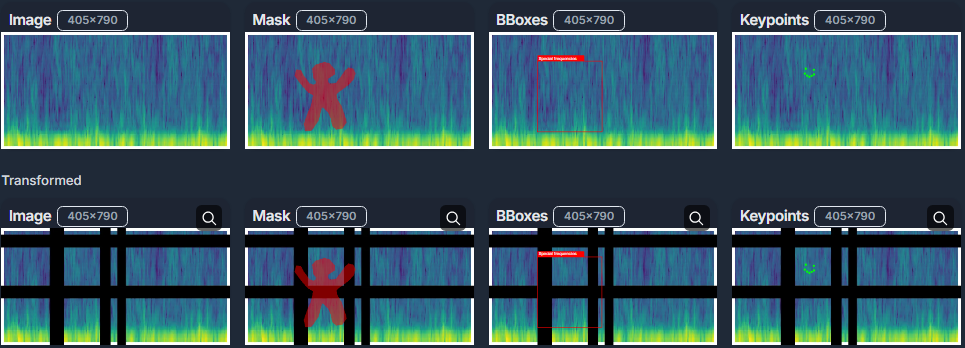

In [36]:
Image("datasets/images/XYMasking.png", width="60%")

**class [XYMasking](https://albumentations.ai/docs/api_reference/augmentations/dropout/xy_masking/) (num_masks_x = 0, num_masks_y = 0, mask_x_length = 0, mask_y_length = 0, fill = 0, fill_mask = None, p = 0.5)**

**num_masks_x** - число (**int**) или диапазон (**tuple**) вертикальных полос для маскировки.

**num_masks_y** - число (**int**) или диапазон (**tuple**) горизонтальных полос для маскировки.

**mask_x_length** - задает толщину полос по вертикали. Значения: число (**int**) или диапазон (**tuple**).

**mask_y_length** - задает толщину полос по горизонтали. Значения: число (**int**) или диапазон (**tuple**).

**fill** - задаёт, каким образом заполняются значения замаскированных пикселей.

- **int** или **float** - все пиксели в области маскирования заполняются этим значением во всех каналах.

- **tuple** - для каждого канала используется соответствующее значение из кортежа.

- **random** - каждый пиксель в области маскирования заполняется случайными значениями, причём для каждого пикселя значения генерируются независимо.

- **random_uniform** - для каждой маскированной области генерируется один случайный цвет и вся область заполняется именно этим единым случайным цветом.

- **inpaint_telea** и **inpaint_ns** -  используется алгоритм inpainting OpenCV. Вместо простого заполнения, замаскированные области заполняются, основываясь на информации из окружающих пикселей с использованием данного алгоритма восстановления.

**fill_mask** - задаёт, каким образом заполняются значения замаскированных пикселей для масок. 

**p** - вероятность применения трансформации.

# [D4](https://explore.albumentations.ai/transform/D4)

Включает такие преобразования, как 1. тождественность - преобразование не применяется, 2. поворот на 90 градусов против часовой стрелки, 3. поворот на 180 градусов, 4. поворот на 270 градусов против часовой стрелки, 5. отражение относительно вертикальной средней линии, 6. отражение относительно антидиагонали, 7. отражение относительно горизонтальной средней линии и 8. отражение относительно главной диагонали.

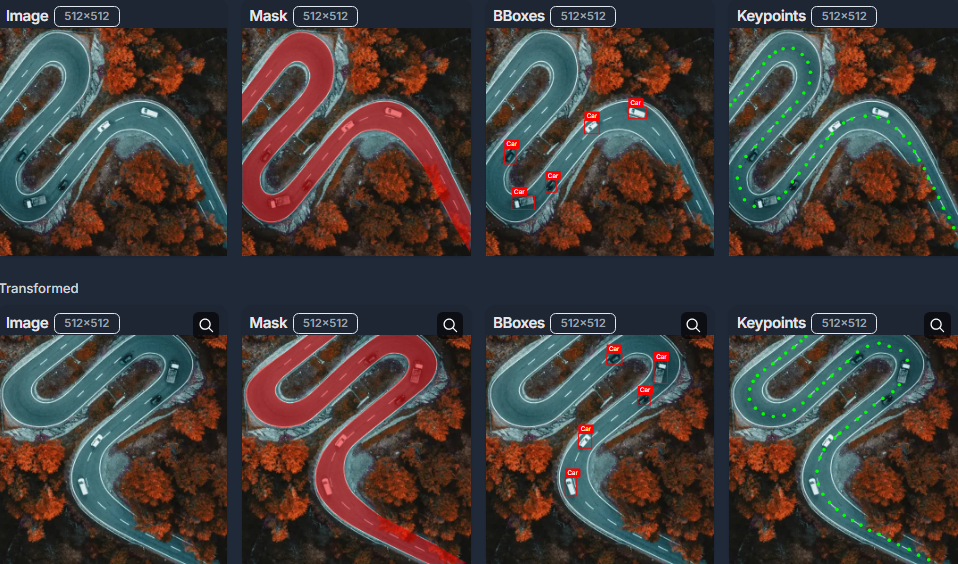

In [21]:
Image("datasets/images/D4.png", width="60%")

**class [D4](https://albumentations.ai/docs/api_reference/augmentations/geometric/transforms/#:~:text=class%20D4) (p = 1.0)**

**p** - вероятность применения трансформации.

# [Rotate](https://explore.albumentations.ai/transform/Rotate)

Поворачивает изображение на угол, выбранный случайным образом из равномерного распределения.

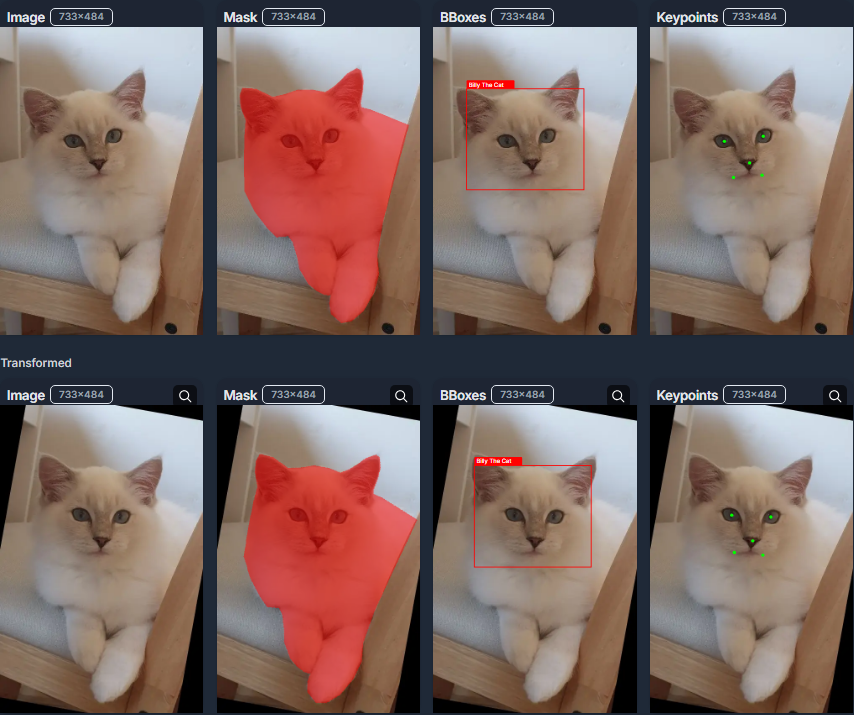

In [33]:
Image("datasets/images/Rotate.png", width="60%")

**class [Rotate](https://albumentations.ai/docs/api_reference/augmentations/geometric/rotate/#:~:text=class%20Rotate) (limit = (-90, 90), interpolation = 1, border_mode = 0, rotate_method = 'largest_box', crop_border = False, mask_interpolation = 0, fill = 0, fill_mask = 0, p = 0.5)**

**limit** - диапазон в виде кортежа, из которого выбирается случайный угол в градусах для поворота. 

**border_mode** - определяет, как обрабатываются пиксели за границами исходного изображения (темные части на изображении сверху).

- **cv2.BORDER_CONSTANT** - заполняет края фиксированным цветом (например, черным) $\newline$ 

- **cv2.BORDER_REPLICATE** - повторяет последний пиксель исходного изображения. $\newline$ 

- **cv2.BORDER_REFLECT** - зеркально отражает изображение относительно края. $\newline$ 

- **cv2.BORDER_WRAP** - "заворачивает" пиксели по принципу текстуры, которая повторяется бесконечно во всех направлениях. Работает так, как бы дублируя и стыкуя повернутое изображение вокруг полученного повернутого изображения.

**fill** и **fill_mask** - цвет (значение) для заполнения пустых областей (пиксели за границами), которые появляются после поворота изображения.

**crop_border** - обрезать ли границу после поворота, чтобы не было пустых областей. Если True, размер выходного изображения может отличаться от входного.

**interpolation** и **mask_interpolation** - определяют, каким методом интерполировать (вычислять) новые пиксели, когда происходит преобразование. При выполнении геометрических преобразований, таких как поворот, новые координаты пикселей могут оказаться не на узлах этой сетки, а между ними (например, $[10.3, 20.7]$). Чтобы вычислить значение в позиции (например, $[10.3, 20.7]$), алгоритм использует методы интерполяции. 

**p** - вероятность применения трансформации.

# [SafeRotate](https://explore.albumentations.ai/transform/SafeRotate)

То же самое, что **Rotate**, только **[SafeRotate](https://albumentations.ai/docs/api_reference/augmentations/geometric/rotate/#:~:text=class%20SafeRotate)** гарантирует, что все повернутое изображение впишется в исходный кадр, уменьшая его масштаб при необходимости.

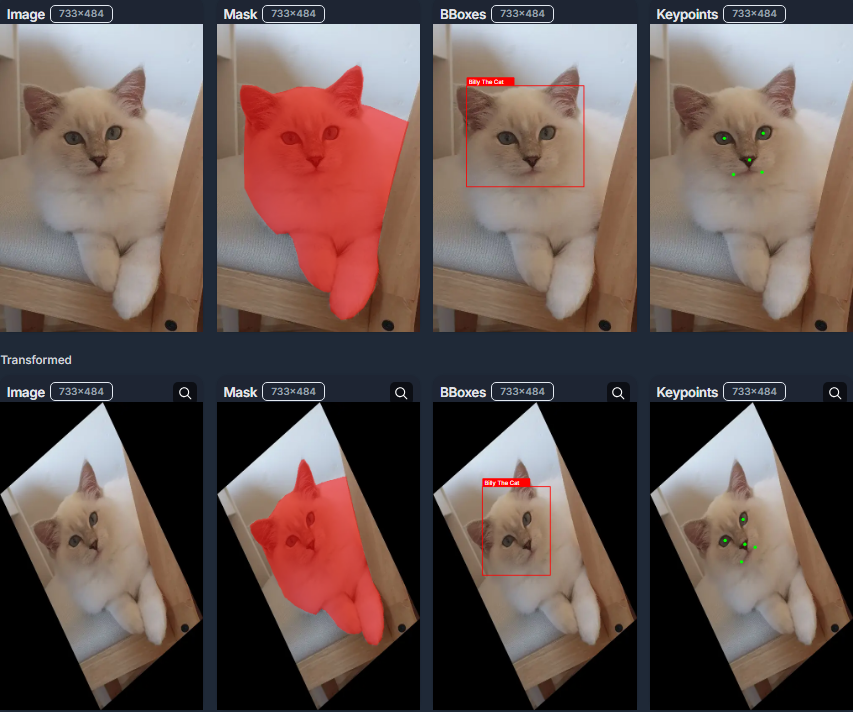

In [35]:
Image("datasets/images/SafeRotate.png", width="60%")

In [43]:
A.SafeRotate()

SafeRotate(p=0.5, limit=(-90.0, 90.0), interpolation=1, border_mode=0, fill=0.0, fill_mask=0.0, rotate_method='largest_box', mask_interpolation=0)

# [RandomRotate90](https://explore.albumentations.ai/transform/RandomRotate90)

Позволяет случайным образом повернуть изображение на 90 градусов ноль или более раз.

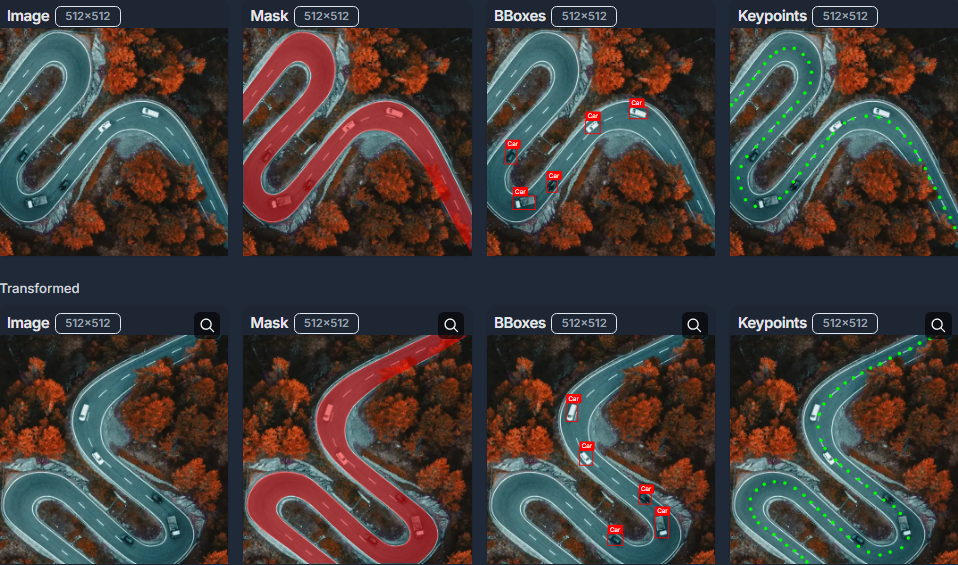

In [34]:
Image("datasets/images/RandomRotate90.png", width="60%")

**class [RandomRotate90](https://albumentations.ai/docs/api_reference/augmentations/geometric/rotate/#:~:text=class%20RandomRotate90) (p = 1)**

**p** - вероятность применения трансформации.

# [Transpose](https://explore.albumentations.ai/transform/Transpose)

Транспонирует изображение, поменяв местами строки и столбцы. Это преобразование переворачивает изображение по его главной диагонали, фактически меняя его ширину и высоту. Это эквивалентно повороту на 90 градусов по часовой стрелке с последующим горизонтальным отражением.

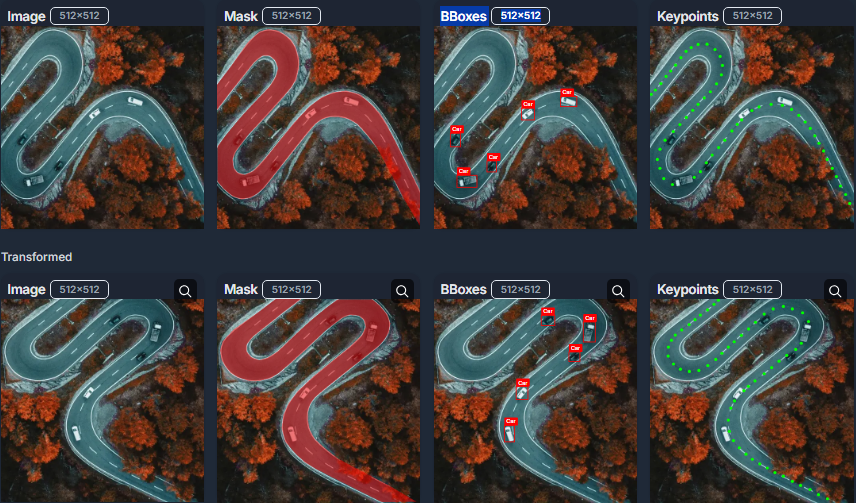

In [44]:
Image("datasets/images/Transpose.png", width="60%")

**class [Transpose](https://albumentations.ai/docs/api_reference/augmentations/geometric/transforms/#:~:text=class%20Transpose) (p = 0.5)**

**p** - вероятность применения трансформации.

# [HorizontalFlip](https://explore.albumentations.ai/transform/HorizontalFlip)

Зеркальное отражение изображения по оси **Y**.

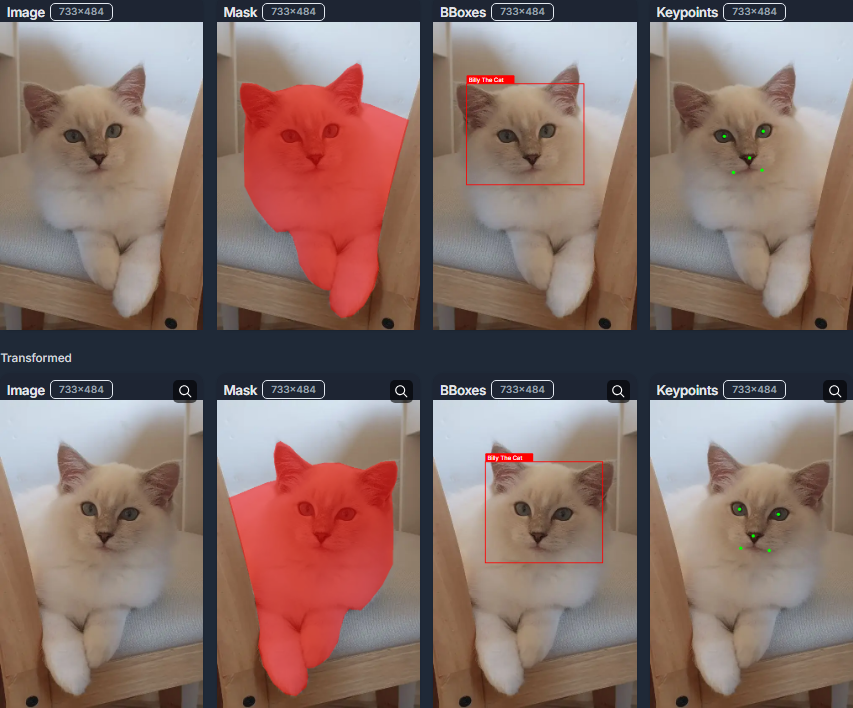

In [46]:
Image("datasets/images/HorizontalFlip.png", width="60%")

**class [HorizontalFlip](https://albumentations.ai/docs/api_reference/augmentations/geometric/transforms/#:~:text=class%20HorizontalFlip) (p = 0.5)**

**p** - вероятность применения трансформации.

# [VerticalFlip](https://explore.albumentations.ai/transform/VerticalFlip)

Зеркальное отражение изображения по оси **X**.

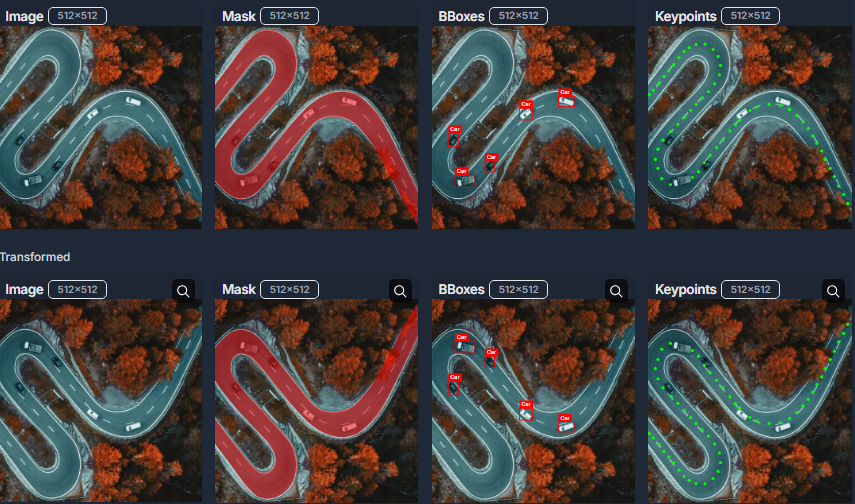

In [48]:
Image("datasets/images/VerticalFlip.png", width="60%")

**class [VerticalFlip](https://albumentations.ai/docs/api_reference/augmentations/geometric/transforms/#:~:text=class%20VerticalFlip) (p = 0.5)**

**p** - вероятность применения трансформации.

# [Resize](https://explore.albumentations.ai/transform/Resize)

Изменяет размеры входного изображения до указанной высоты и ширины.

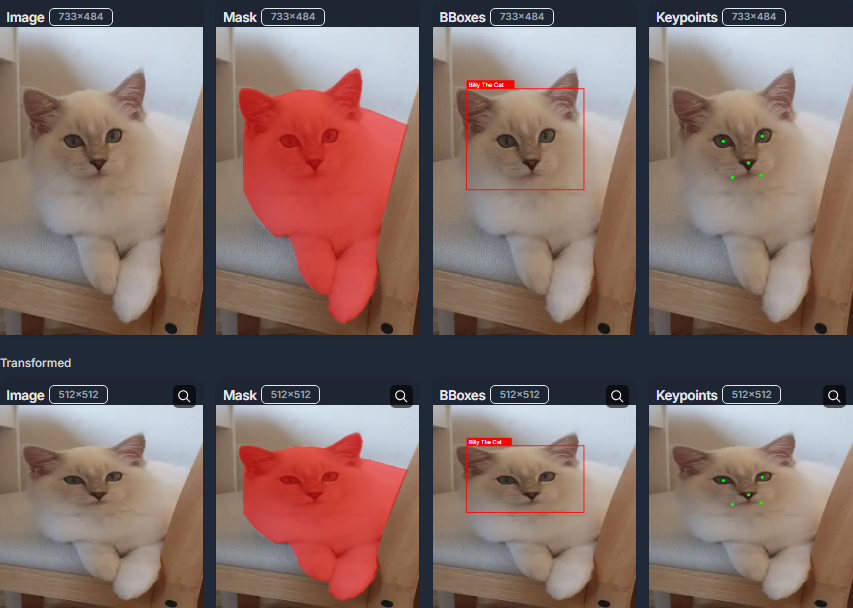

In [11]:
Image("datasets/images/Resize.png", width="60%")

**class Resize (height, width, interpolation=1, mask_interpolation=0, p=1.0)**

**height** - выходная высота изображения.

**width** - выходная ширина изображения.

**p** - вероятность применения трансформации.

# [Perspective](https://explore.albumentations.ai/transform/Perspective)

Класс **Perspective** выполняет случайное преобразование перспективы изображения. Он выбирает четыре угловые точки исходного изображения и случайным образом смещает их, основываясь на заданном параметре **scale**. Для остальных точек положение определяется так, чтобы вся геометрия картинки изменилась согласованно с изменением угловых точек. Результатом является изображение, искажённое так, как если бы его снимали под другим углом или с другой перспективы.

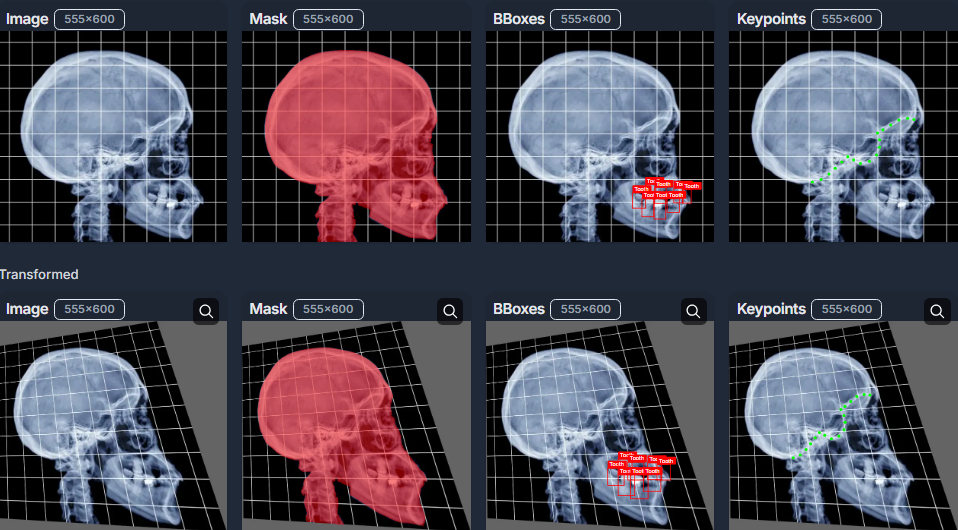

In [13]:
Image("datasets/images/Perspective.png", width="60%")

**class [Perspective](https://albumentations.ai/docs/api_reference/augmentations/geometric/transforms/#:~:text=class%20Perspective) (scale = (0.05, 0.1), keep_size = True, fit_output = False, interpolation = 1, mask_interpolation = 0, border_mode = 0, fill = 0, fill_mask = 0, p = 0.5)**

**scale** - определяет, насколько сильно случайно смещаются угловые точки изображения от их исходных позиций. Для каждой из четырёх углов вычисляется случайное смещение, величина которого определяется «стандартным отклонением» нормального распределения. Значения: $[0, +∞]$ в виде кортежа.

**keep_size** - определяет, нужно ли возвращать изображение к исходному размеру после применения преобразования. **True** - да, **False** - нет. 

**border_mode** - определяет, как обрабатываются пиксели за границами исходного изображения (серые части на изображении сверху).

- **cv2.BORDER_CONSTANT** - заполняет края фиксированным цветом (например, серым) $\newline$ 

- **cv2.BORDER_REPLICATE** - повторяет последний пиксель исходного изображения. $\newline$ 

- **cv2.BORDER_REFLECT** - зеркально отражает изображение относительно края. $\newline$ 

- **cv2.BORDER_WRAP** - "заворачивает" пиксели по принципу текстуры, которая повторяется бесконечно во всех направлениях. Работает так, как бы дублируя и стыкуя преобразованное изображение вокруг полученного преобразованного изображения.

**fill** и **fill_mask** - цвет (значение) для заполнения пустых областей, которые появляются, когда часть изображения оказывается вне исходной области после преобразования. Диапазон ожидаемых значений — $[0, 255]$ для uint8 изображений. **fill_mask** - то же самое, но для масок. Используется только при **border_mode = cv2.BORDER_CONSTANT**.

**fit_output** - если установлено в **True**, то перед масштабированием обратно к исходному размеру (если **keep_size = True**) происходит вычисление оптимального размера так, чтобы сохранить всё изображение после преобразования. Если **False**, части преобразованного изображения могут оказаться за пределами плоскости изображения.

**interpolation** и **mask_interpolation** - определяют, каким методом интерполировать (вычислять) новые пиксели, когда происходит преобразование. При выполнении геометрических преобразований новые координаты пикселей могут оказаться не на узлах этой сетки, а между ними (например, $[10.3, 20.7]$). Чтобы вычислить значение в позиции (например, $[10.3, 20.7]$), алгоритм использует методы интерполяции. 

**p** - вероятность применения трансформации.

# [ElasticTransform](https://explore.albumentations.ai/transform/ElasticTransform)

Создаёт эффект «эластичной деформации» изображения – как будто изображение растягивается, сжимается или расплывается в разных местах, но при этом структура (например, контуры объектов) остаётся узнаваемой.

Сначала для каждого пикселя создаётся случайное смещение. Это делается путем генерации двух (или одной, если **same_dxdy = True**) шумовых карт, где значения выбираются либо по нормальному (гауссовскому), либо равномерному распределению (параметр **noise_distribution**). Эти карты определяют, насколько сдвинется каждый пиксель по оси **X** и **Y**.

Полученные случайные значения умножаются на коэффициент **alpha**. Он определяет, насколько сильной будет деформация – чем больше **alpha**, тем сильнее смещение (то есть «растяжение» или «сжатие»).

Чтобы деформация выглядела естественно, шумовые карты сглаживаются Гауссовым фильтром с параметром **sigma** (стандартное отклонение). Более высокое **sigma** приводит к более плавным деформациям.

На основе полученных смещений создаются карты координат (дискретные поля, по которым определяется новое положение каждого пикселя). Затем, используя выбранный метод интерполяции (параметр **interpolation** для изображений и **mask_interpolation** для масок), изображение «перепроецируется» согласно этим картам.

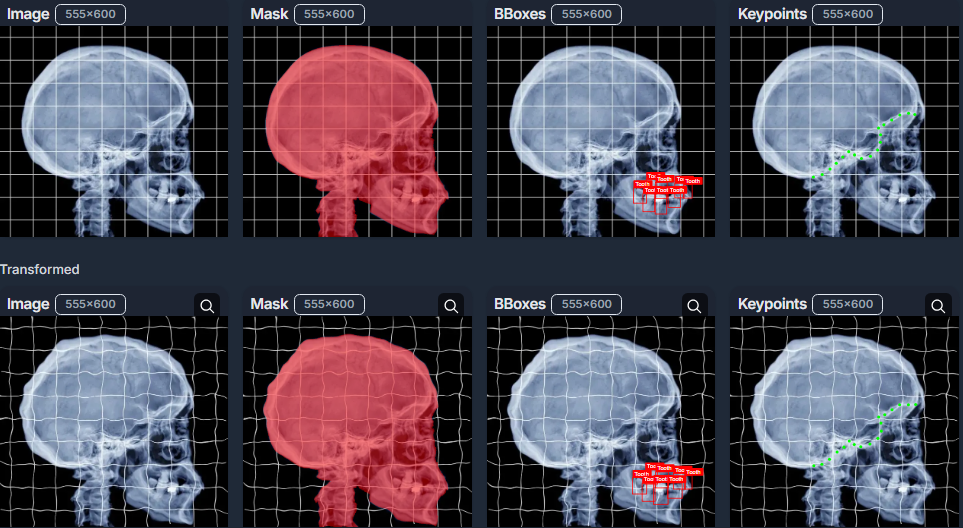

In [33]:
Image("datasets/images/ElasticTransform.png", width="70%")

**class [ElasticTransform](https://albumentations.ai/docs/api_reference/augmentations/geometric/transforms/#:~:text=class%20ElasticTransform) (alpha = 1, sigma = 50, interpolation = 1, approximate = False, same_dxdy = False, mask_interpolation = 0, noise_distribution = 'gaussian', keypoint_remapping_method = 'mask', p = 0.5)**

**alpha** - сила смещения. Чем больше **alpha**, тем сильнее деформация. Значения: $[0, +∞]$, где $0$ - нет смещении. 

**sigma** - cтандартное отклонение фильтра Гаусса. Более высокие значения приводят к более гладким искажениям. Значения: $[1, +∞]$

**approximate** - если **True**, используется упрощённая (быстрая) версия Гауссова фильтра. **False** - более точная версия. 

**same_dxdy** - если **True**, смещения по **X** и **Y** генерируются одинаковыми, что ускоряет вычисления, но уменьшает разнообразие деформаций.

**interpolation** - метод интерполяции для преобразования изображения.

**mask_interpolation** - метод интерполяции для масок.

**noise_distribution** - распределение, используемое для генерации карт смещения. Значения: **gaussian** для нормального распределения или **uniform** для равномерного.

**keypoint_remapping_method** – способ пересчёта координат ключевых точек: **mask** (быстро) или **direct** (точнее).

**p** - вероятность применения трансформации.

# [GridDistortion](https://explore.albumentations.ai/transform/GridDistortion)

Это преобразование делит изображение на сетку и случайным образом искажает каждую ячейку, создавая локальные эффекты деформации. Изображение разделяется на равные по размеру области, которые впоследствии будут искажаться независимо друг от друга.

Параметр **num_steps** определяет, на сколько ячеек разбивается изображение по горизонтали и вертикали. Например, если **num_steps = 5**, то изображение делится на 5 равных частей по горизонтали и 5 по вертикали. Однако контрольных линий будет на одну больше для каждой оси – то есть 6 линий по горизонтали и 6 по вертикали. Эти линии представляют собой границы ячеек, то есть их пересечения образуют контрольные точки.

Для каждой контрольной горизонтальной и вертикальной линии сетки генерируются случайные коэффициенты искажения:

```python
steps_x = [1 + uniform(distort_limit) for _ in range(num_steps + 1)]
steps_y = [1 + uniform(distort_limit) for _ in range(num_steps + 1)]
```

**distort_limit** задает диапазон смещений. Например, при **distort_limit = (-0.3, 0.3)** коэффициенты будут в диапазоне $[0.7, 1.3]$

Расстояние между точками осталось одинаковым после трансформации: 100 -> 110
[100, 200, 300, 400, 500, 600] -> [110, 220, 330, 440, 550, 660]


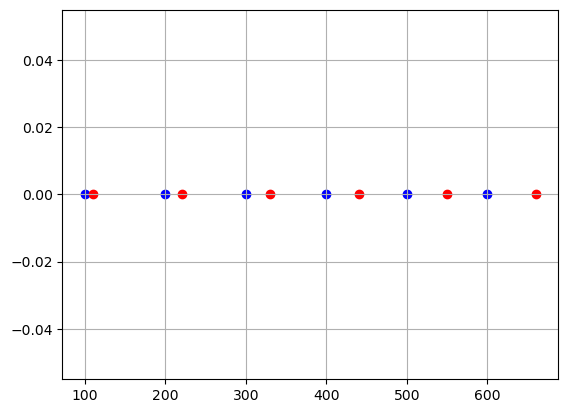

In [15]:
a = [100, 200, 300, 400, 500, 600]  # Координаты по оси x
a_t = list(map(lambda x: int(x * 1.1), a))  # Умножаем каждую координату на 1.1
y = [0, 0, 0, 0, 0, 0]

print("Расстояние между точками осталось одинаковым после трансформации: 100 -> 110")
print(a, "->", a_t)

plt.scatter(a, y, c="blue")
plt.scatter(a_t, y, c="red")
plt.grid()

**steps_x** и **steps_y** можно воспринимать, как множители:

- Если множитель меньше 1 (например, 0.8):
    Это означает, что контрольная точка сдвигается в сторону начала координат по сравнению с её исходным положением. Например, если координата равна 0.4, то после умножения на 0.8 она станет 0.32. То есть линия будет расположена ближе к нулевой границе — «сдвинутой внутрь» относительно центра изображения. $\newline$

- Если множитель больше 1 (например, 1.2):
    В этом случае контрольная точка перемещается дальше от начала координат. Например, координата 0.4 после умножения на 1.2 станет 0.48, то есть линия окажется дальше от нулевой границы — «сдвинутой наружу».

На пересечении горизонтальной и вертикальной контрольных линий создаётся контрольная точка, у которой координаты вычисляются на основе соответствующих значений из списков **steps_x** и **steps_y**.

После определения новых позиций контрольных точек для всего изображения используется билинейная интерполяция. Это позволяет вычислить смещённые координаты для каждого пикселя внутри ячейки сетки, обеспечивая плавное переходное искажение.

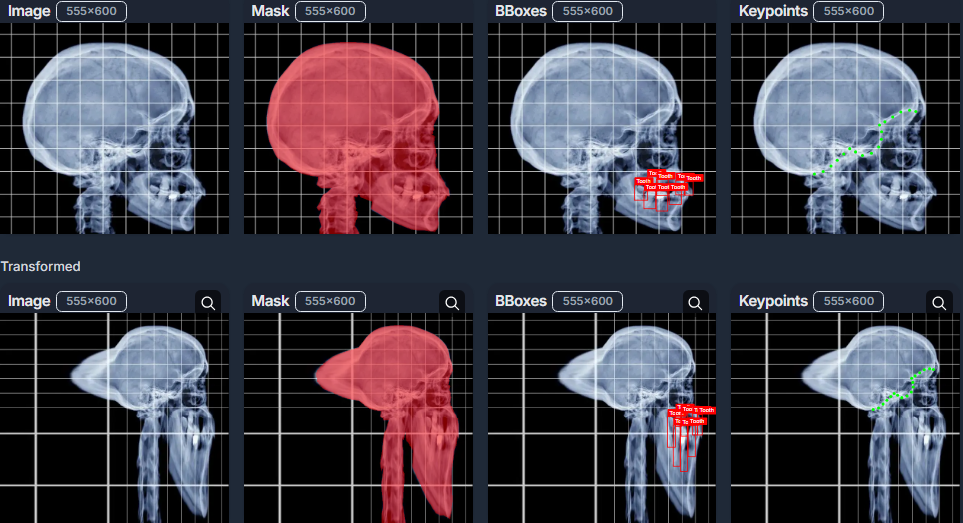

In [4]:
Image("datasets/images/GridDistortion.png", width="70%")

**class [GridDistortion](https://albumentations.ai/docs/api_reference/augmentations/geometric/transforms/#:~:text=class%20GridDistortion) (num_steps = 5, distort_limit = (-0.3, 0.3), interpolation = 1, normalized = True, mask_interpolation = 0, keypoint_remapping_method = 'mask', p = 0.5)**

**num_steps** - определяет, на сколько частей (по каждой оси) будет разделено изображение. При значении **num_steps = 5** изображение делится на 5 равномерных ячеек по горизонтали и 5 по вертикали. Чем больше **num_steps**, тем более мелкие области будут искажаться независимо. Значения: число (**int**).

**distort_limit** - задаёт диапазон случайных смещений для каждой контрольной линии. Параметр управляет, насколько сильно каждая контрольная линия (и, как следствие, область между линиями) будет смещена от своей исходной позиции. Значения: диапазон в виде кортежа.

**normalized** - если **normalized = True**, алгоритм дополнительно корректирует смещения контрольных линий так, чтобы итоговая деформация не приводила к выходу пикселей за пределы исходного изображения. Это гарантирует, что даже при сильном смещении линии вся информация останется в пределах изображения, хотя искажения могут стать менее экстремальными.

**interpolation** - метод интерполяции для преобразования изображения.

**mask_interpolation** - метод интерполяции для масок.

**keypoint_remapping_method** – способ пересчёта координат ключевых точек: **mask** (быстро) или **direct** (точнее).

**p** - вероятность применения трансформации.

# [GridElasticDeform](https://explore.albumentations.ai/transform/GridElasticDeform)

Применяет эластичные деформации к изображению с использованием сеточного подхода.

Исходное изображение делится на равномерную сетку, определяемую параметром **num_grid_xy**. Например, при $(4,\, 4)$ изображение разделяется на 4 колонки и 4 строки, а контрольные точки формируют сетку **5 x 5**.

Для каждой контрольной точки (то есть для каждой точки, где пересекаются линии сетки) генерируется два случайных смещения — по оси **X** и по оси **Y**. Эти смещения выбираются таким образом, что абсолютное значение не превышает заданное значение **magnitude**.

После того как новые положения контрольных точек вычислены, на основе исходной и деформированной сетки создается карта деформации (обычно с использованием билинейной интерполяции). Эта карта определяет, как перемещаются пиксели внутри каждой ячейки сетки.

Полученная карта применяется ко всему изображению.

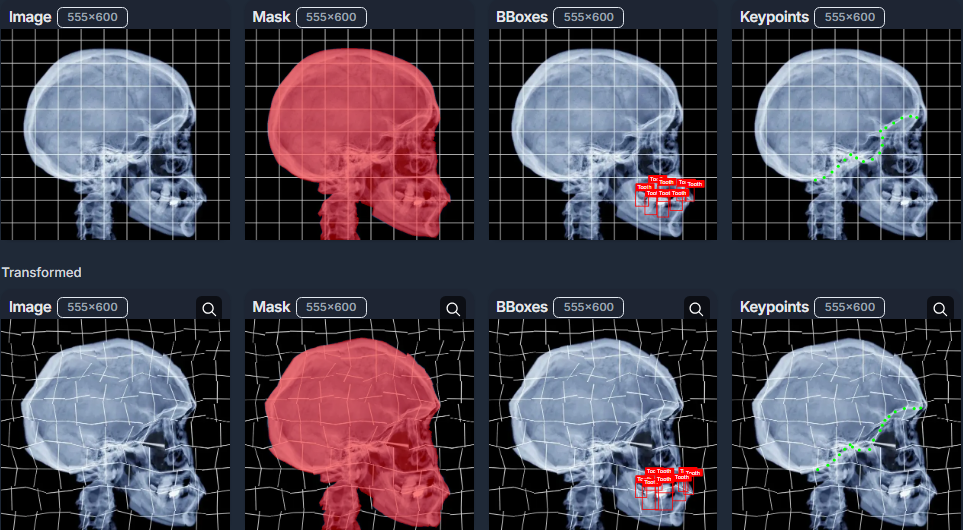

In [16]:
Image("datasets/images/GridElasticDeform.png", width="70%")

**class [GridElasticDeform](https://albumentations.ai/docs/api_reference/augmentations/geometric/transforms/#:~:text=class%20GridElasticDeform) (num_grid_xy, magnitude, interpolation = 1, mask_interpolation = 0, p = 1.0)**

**num_grid_xy** - определяет количество ячеек сетки вдоль горизонтали и вертикали. Значения: диапазон в виде кортежа (**tuple[int, int]**).

**magnitude** - максимальное смещение в пикселях, которое может быть применено к каждой контрольной точке сетки. Значения: число (**int**) > 0.

**interpolation** - метод интерполяции для преобразования изображения.

**mask_interpolation** - метод интерполяции для масок.

**p** - вероятность применения трансформации.

# [OpticalDistortion](https://explore.albumentations.ai/transform/OpticalDistortion)

Имитирует оптические искажения, которые возникают из-за особенностей оптики камеры или эффекта «рыбьего глаза». 

При каждом вызове трансформации для изображения случайно выбирается значение коэффициента из интервала distort_limit. Это значение определяет степень искажения, которое будет применено.

В зависимости от параметра **mode** используется одна из двух моделей:

- **Camera Model**:
    
    Здесь используется классическая модель оптической дисторсии, как в калибровке камеры OpenCV. Коэффициент искажения применяется ко всем точкам изображения, имитируя незначительные «деформации» из-за несовершенства объектива. $\newline$
    
- **Fisheye Model**:

    В этом режиме искажение рассчитывается по формуле $r\_dist = r \cdot (1 + gamma \cdot r^{\,2})$. Такая модель создаёт эффект «рыбьего глаза», где искажение усиливается по мере удаления от центра изображения.

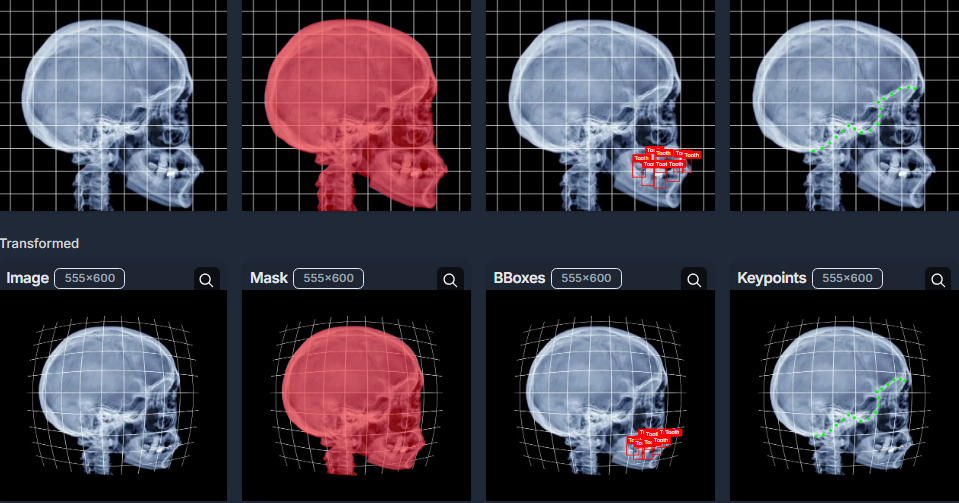

In [22]:
Image("datasets/images/OpticalDistortion.png", width="70%")

**class [OpticalDistortion](https://albumentations.ai/docs/api_reference/augmentations/geometric/transforms/#:~:text=class%20OpticalDistortion) (distort_limit = (-0.05, 0.05), interpolation = 1, mask_interpolation = 0, mode = 'camera', keypoint_remapping_method = 'mask', p = 0.5)**

**distort_limit** - диапазон коэффициента искажения. Для модели камеры (**mode = camera**) рекомендуется диапазон $(-0.05, 0.05)$, так как обычные оптические искажения для стандартных камер невелики. Для модели «рыбьего глаза» (**mode = fisheye**) допустимый диапазон расширяется (например, $(-0.3, 0.3)$), поскольку такие объективы создают более сильное радиальное искажение.

**mode** - определяет, какая модель оптического искажения будет использоваться. Значения: **camera** и **fisheye**.

**interpolation** - метод интерполяции для преобразования изображения.

**mask_interpolation** - метод интерполяции для масок.

**keypoint_remapping_method** – способ пересчёта координат ключевых точек: **mask** (быстро) или **direct** (точнее).

**p** - вероятность применения трансформации.

# [ThinPlateSpline](https://explore.albumentations.ai/transform/ThinPlateSpline)

Создает гладкие, нелинейные деформации изображения, имитируя эффект гибкого «металлического листа», который можно сгибать.

Изначально изображение делится на равномерную сетку, где точки равномерно распределены по ширине и высоте. Например, при **num_control_points = 4** создается сетка **4 x 4** (или контрольных точек 16).

Каждая контрольная точка смещается на случайное значение, выбранное из диапазона, заданного в **scale_range**.

На основе новых позиций контрольных точек алгоритм рассчитывает функцию тонкой пластинчатой сплайновой (Thin Plate Spline) интерполяции. Эта функция обеспечивает гладкое, непрерывное распределение смещений по всему изображению, минимизируя резкие изменения и создавая естественный «более сглаженный» эффект. Cоздается карта, по которой перемещаются пиксели изображения.

Полученные деформации применяются к изображению.

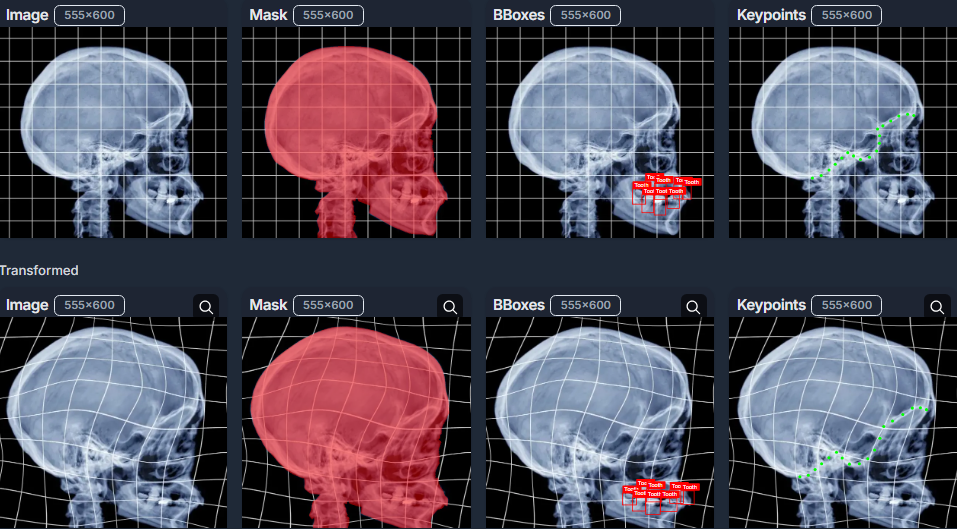

In [26]:
Image("datasets/images/ThinPlateSpline.png", width="70%")

**class [ThinPlateSpline](https://albumentations.ai/docs/api_reference/augmentations/geometric/transforms/#:~:text=class%20ThinPlateSpline) (scale_range = (0.2, 0.4), num_control_points = 4, interpolation = 1, mask_interpolation = 0, keypoint_remapping_method = 'mask', p = 0.5)**

**scale_range** - диапазон случайного смещения контрольных точек. Значения: диапазон $[0, 1]$ в виде кортежа.

- Значение 0 означает отсутствие смещения (трансформация не изменяет изображение).

- При значениях около 0.1 и ниже деформация будет слабой (слегка «подтянутая» поверхность).

- Диапазон 0.2–0.4 дает умеренные искажения.

- При значениях 0.5 и выше эффект становится более сильным и «экстремальным».

**num_control_points** - определяет количество контрольных точек вдоль каждой оси, формируя сетку из **num_control_points x num_control_points** точек. Значения: целое число >= 2.

- Минимальное значение 2 приводит к почти аффинной трансформации.

- При значениях 3–4 появляется умеренная гибкость и локальное управление деформацией.

- Значения 5 и более позволяют достичь более детального локального контроля, но могут замедлять вычисления.

**interpolation** - метод интерполяции для преобразования изображения.

**mask_interpolation** - метод интерполяции для масок.

**keypoint_remapping_method** – способ пересчёта координат ключевых точек: **mask** (быстро) или **direct** (точнее).

**p** - вероятность применения трансформации.